### Line up all peaks of hatchery fish
### Line up wild fish numbers for hatchery peaks

In [162]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sys import platform
from scipy import stats
from scipy.signal import find_peaks
from scipy.signal import peak_widths
from scipy.signal import argrelextrema
import matplotlib.gridspec as gridspec

In [2]:
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/"
    output_string = "/home/maria/Documents/output/pied_piper/"
else:
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/"

In [3]:
df = pd.read_csv(data_string + "dungeness_2005-2020_combine_ma_msd_atu_photoperiod.csv", header = 0)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)

,Unnamed: 0,Unnamed: 0_x,Unnamed: 0.1,Date,In,chinook0_hatchery_perhour,chinook0_wild_perhour,chinook0_hatchery_num,chinook0_wild_num,chinook1_hatchery_perhour,chinook1_wild_perhour,chinook1_hatchery_num,chinook1_wild_num,coho1_hatchery_perhour,coho1_wild_perhour,coho1_hatchery_num,coho1_wild_num,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_hatchery_perhour,pink0_wild_perhour,pink0_hatchery_num,pink0_wild_num,chum0_wild_perhour,chum0_wild_num,flow,temp,doy,year,ma_chinook0_wild_perhour,msd_chinook0_wild_perhour,ma_chinook1_wild_perhour,msd_chinook1_wild_perhour,ma_coho1_wild_perhour,msd_coho1_wild_perhour,ma_steelheadsmolt_wild_perhour,msd_steelheadsmolt_wild_perhour,ma_chum0_wild_perhour,msd_chum0_wild_perhour,ma_pink0_wild_perhour,msd_pink0_wild_perhour,ma_temp,ma_flow,chinook0_wild_perhour_mean,chinook1_wild_perhour_mean,coho1_wild_perhour_mean,steelheadsmolt_wild_perhour_mean,chum0_wild_perhour_mean,pink0_wild_perhour_mean,temp_mean,flow_mean,ma_chinook0_wild_perhour_mean,msd_chinook0_wild_perhour_mean,ma_chinook1_wild_perhour_mean,msd_chinook1_wild_perhour_mean,ma_coho1_wild_perhour_mean,msd_coho1_wild_perhour_mean,ma_steelheadsmolt_wild_perhour_mean,msd_steelheadsmolt_wild_perhour_mean,ma_chum0_wild_perhour_mean,msd_chum0_wild_perhour_mean,ma_pink0_wild_perhour_mean,msd_pink0_wild_perhour_mean,ma_temp_mean,ma_flow_mean,temp_y,atu_solstice,temp_z,atu_april,Unnamed: 0_y,photoperiod
0,0,0,0,2005-03-08,19.733333,0.000000,4.358108,0.0,86.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,5.371622,0.0,106.0,13.581081,268.0,154.000000,7.000000,67,2005,6.427303,4.216610e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,70.129497,5.579530e+01,9.331162e+00,8.849078e+00,7.333333,169.416667,2.292856,0.000000,0.040055,0.004310,5.616000,36.781206,4.576167,322.718750,2.059401,0.664604,0.009222,0.005591,0.044752,3.402953e-02,0.015928,0.016310,6.712731,4.589944,23.445381,14.845106,4.517493,335.270493,7.152083,330.529836,NaN,NaN,66,11.500000
1,1,1,1,2005-03-09,19.583333,0.000000,8.159234,0.0,61.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,22.396268,0.0,91.0,141.391232,794.0,179.333333,7.800000,68,2005,6.544989,3.661161e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,66.780577,4.889697e+01,7.853446e+00,8.345529e+00,7.296667,169.133333,1.902207,0.008623,0.013579,0.000000,14.840670,5.994112,4.508802,377.708333,2.306909,1.011803,0.008137,0.005615,0.053040,4.197360e-02,0.013894,0.013135,7.897054,4.771679,23.660343,15.190011,4.599515,345.601148,7.455208,337.985044,NaN,NaN,67,11.566667
2,2,2,2,2005-03-10,23.300000,0.000000,1.800031,0.0,25.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,2.895837,0.0,40.0,40.919362,562.0,175.000000,7.200000,69,2005,7.068838,3.517071e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,65.603471,4.382972e+01,7.023682e+00,7.736235e+00,7.155556,167.361111,1.397627,0.004762,0.007547,0.013364,6.006996,18.828639,4.607123,315.733333,2.558576,0.963248,0.008709,0.005865,0.051861,4.265551e-02,0.016339,0.011624,9.213090,4.187352,29.628901,14.310770,4.728997,358.798214,7.430208,345.415252,NaN,NaN,68,11.616667
3,3,3,3,2005-03-11,24.266667,0.000000,11.391838,0.0,119.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,6.660921,0.0,75.0,84.626313,1038.0,169.333333,7.333333,70,2005,7.784130,3.726883e+00,0.000000,0.000000e+00,1.051709e-02,2.782561e-02,0.000000e+00,0.000000e+00,71.896267,4.333665e+01,6.693555e+00,7.115991e+00,7.083333,165.095238,3.303775,0.013993,0.110683,0.032239,11.091010,28.489916,4.851706,373.968750,2.711612,0.907228,0.006390,0.005597,0.046749,4.436930e-02,0.017665,0.012581,11.269826,4.395349,32.515987,15.596971,4.817864,361.650595,7.088542,352.503794,NaN,NaN,69,11.683333
4,4,4,4,2005-03-12,22.866667,0

In [52]:
def find_first_peak(df, species, age):
    fig = plt.figure(figsize=(20,8))
    if species == "coho":
        threshold = 50
        plt.plot(df['coho1_hatchery_perhour'])
        plt.yscale("log")
        peaks_coho1_on1, _ = find_peaks(df['coho1_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['coho1_hatchery_perhour']
    elif species == "chinook":
        if age == "0":
            threshold = 10
            plt.plot(df['chinook0_hatchery_perhour'])
            peaks_coho1_on1, _ = find_peaks(df['chinook0_hatchery_perhour'], height=threshold) # height is the threshold value
            
            df = df['chinook0_hatchery_perhour']
        elif age == "1":
            threshold = 50
            plt.plot(df['chinook1_hatchery_perhour'])
            plt.yscale("log")
            peaks_coho1_on1, _ = find_peaks(df['chinook1_hatchery_perhour'], height=threshold) # height is the threshold value
            df = df['chinook1_hatchery_perhour']
    elif species == "steelhead":
        threshold = 5
        plt.plot(df['steelheadsmolt_hatchery_perhour'])
        plt.yscale("log")
        peaks_coho1_on1, _ = find_peaks(df['steelheadsmolt_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['steelheadsmolt_hatchery_perhour']
        
    print(peaks_coho1_on1)
    peaks_coho1_on1_list = []
    for i in range(len(peaks_coho1_on1)): #finding only the first peak in a 4 day interval
        if i == 0:
            peaks_coho1_on1_list.append(peaks_coho1_on1[i])
        else:

            if (peaks_coho1_on1[i]  - peaks_coho1_on1[i-1]) < 100: #changing 4 to 10 #let's say one peaks per year (so 100)
                continue
            else:
                peaks_coho1_on1_list.append(peaks_coho1_on1[i])
    results_half = peak_widths(df, peaks_coho1_on1_list, rel_height=0.5)
    results_full = peak_widths(df, peaks_coho1_on1, rel_height=0.999)
    plt.scatter(peaks_coho1_on1_list,df[peaks_coho1_on1_list], color = 'r')
    plt.hlines(*results_half[1:], color="C2")
    plt.hlines(*results_full[1:], color="C3")
    plt.yscale("log")
    #plt.xlim(1500,2000)
    return(peaks_coho1_on1_list,results_full) 

[ 413  439  442  446  448  452  454  607  634  769  771  784  799  805
  968  975  977 1136 1138 1141 1144 1147 1149 1325 1330 1332 1337 1344
 1523 1525 1527 1547 1730 1732 1734 1737 1895 1899 1901 1909 1913 1917
 1919 1922 2068 2073 2076 2080 2211 2215 2386 2390 2392 2398 2401 2412
 2571 2728 2730 2735]


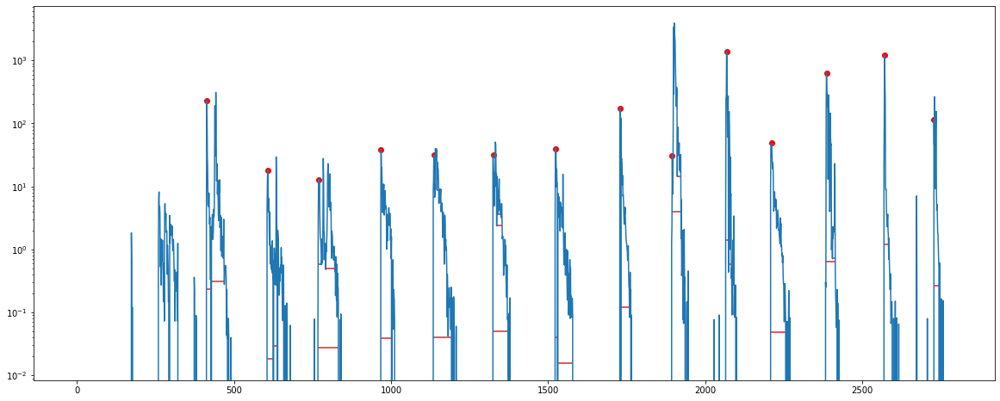

In [54]:
peaks, widths = find_first_peak(df,"chinook","0")

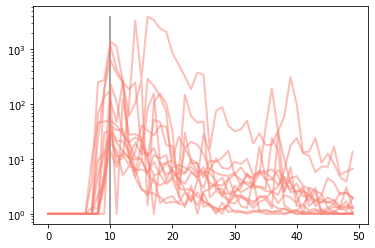

In [157]:
fig = plt.figure(figsize=(6,4))
for i in range(len(peaks)):
    plt.plot(range(50), df['chinook0_hatchery_perhour'][peaks[i]-10:peaks[i]+40]+1, color="salmon", alpha = 0.5, linewidth = 2)
    plt.vlines(10,0,4000, "gray", alpha = 0.1)
    plt.yscale("log")

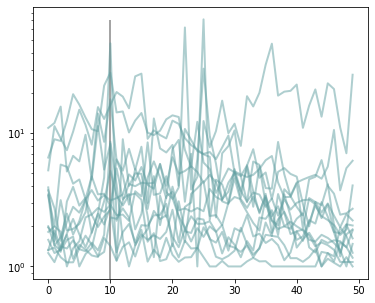

In [158]:
fig = plt.figure(figsize=(6,5))
for i in range(len(peaks)):
    plt.plot(range(50), df['chinook0_wild_perhour'][peaks[i]-10:peaks[i]+40] + 1, color= "cadetblue", linewidth = 2, alpha = 0.5)
    plt.vlines(10,0,70, "gray", alpha = 0.1)
    plt.yscale("log")

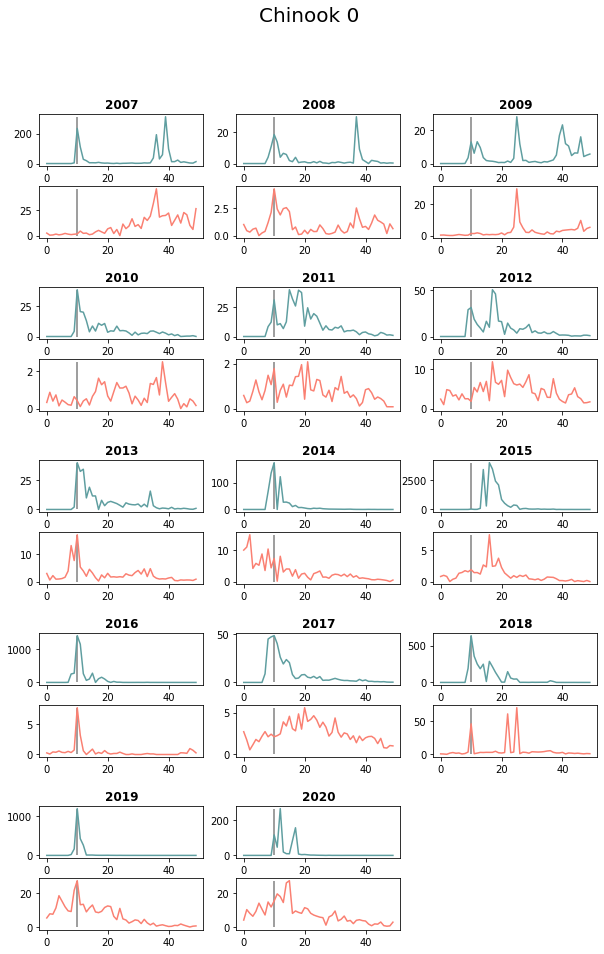

In [160]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(10, 15))
plt.suptitle("Chinook 0", fontsize = 20)
outer = gridspec.GridSpec(5, 3, wspace=0.2, hspace=0.4)

for i in range(14):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.4)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
#         t = ax.text(0.5,0.5, 'outer=%d, inner=%d' % (i, j))
#         t.set_ha('center')
        if j == 0:
            ax.plot(range(50), df['chinook0_hatchery_perhour'][peaks[i]-10:peaks[i]+40], "cadetblue")
            ax.vlines(10,0,np.max(df['chinook0_hatchery_perhour'][peaks[i]-10:peaks[i]+40]), "black", alpha = 0.5)
            ax.set_title(df['year'][peaks[i]], fontweight="bold")
        else:               
            ax.plot(range(50), df['chinook0_wild_perhour'][peaks[i]-10:peaks[i]+40], "salmon")
            ax.vlines(10,0,np.max(df['chinook0_wild_perhour'][peaks[i]-10:peaks[i]+40]), "black", alpha = 0.5)
#         ax.set_xticks([])
#         ax.set_yticks([])
        
        fig.add_subplot(ax)

plt.savefig(output_string + '/chinook0_hatchery_wild_all_years.jpeg', dpi = 300)

[  55   57   60  426  428  612  784  954 1116 1119 1301 1304 1503 1697
 1879 1883 1887 1891 2048 2199 2201 2373 2546 2548 2552 2557 2707]


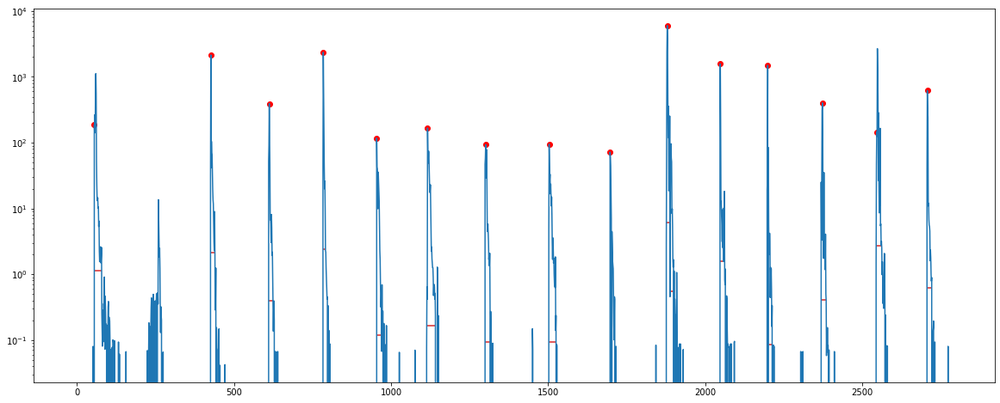

In [127]:
peaks_coho, widths_coho = find_first_peak(df, "coho","1")




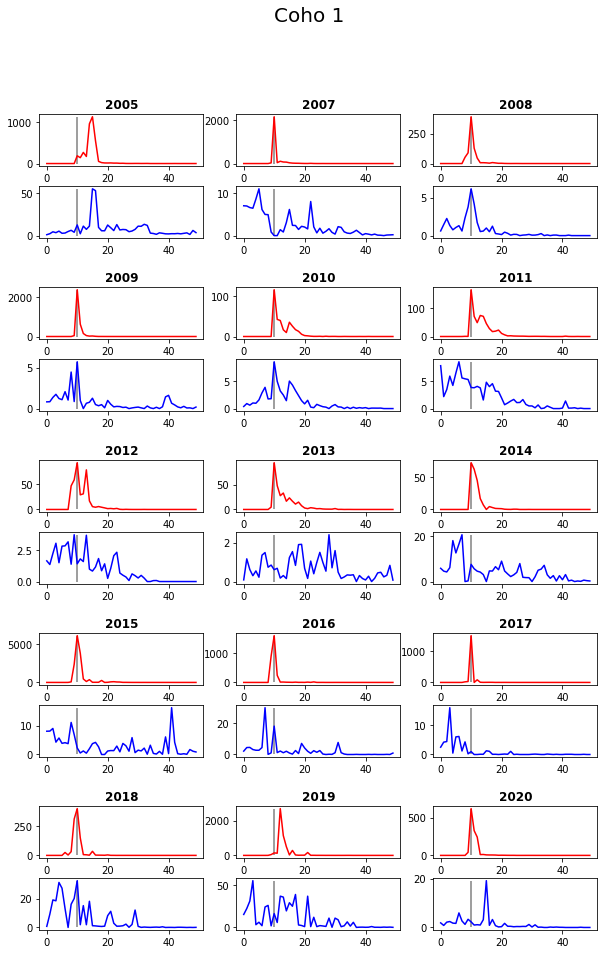

In [134]:

fig = plt.figure(figsize=(10, 15))
plt.suptitle("Coho 1", fontsize = 20)
outer = gridspec.GridSpec(5, 3, wspace=0.2, hspace=0.4)

for i in range(15):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.4)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
#         t = ax.text(0.5,0.5, 'outer=%d, inner=%d' % (i, j))
#         t.set_ha('center')
        if j == 0:
            ax.plot(range(50), df['coho1_hatchery_perhour'][peaks_coho[i]-10:peaks_coho[i]+40], "red")
            ax.vlines(10,0,np.max(df['coho1_hatchery_perhour'][peaks_coho[i]-10:peaks_coho[i]+40]), "black", alpha = 0.5)
            ax.set_title(df['year'][peaks_coho[i]], fontweight="bold")
        else:               
            ax.plot(range(50), df['coho1_wild_perhour'][peaks_coho[i]-10:peaks_coho[i]+40], "blue")
            ax.vlines(10,0,np.max(df['coho1_wild_perhour'][peaks_coho[i]-10:peaks_coho[i]+40]), "black", alpha = 0.5)
#         ax.set_xticks([])
#         ax.set_yticks([])
        
        fig.add_subplot(ax)
plt.savefig(output_string + '/coho1_hatchery_wild_all_years.jpeg', dpi = 300)

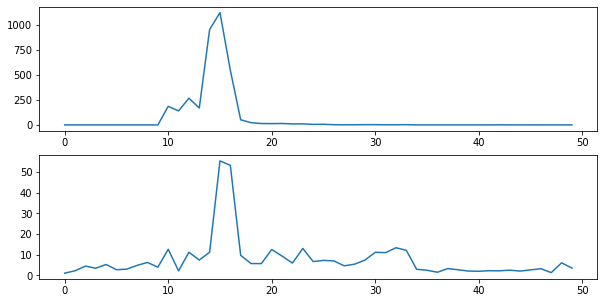

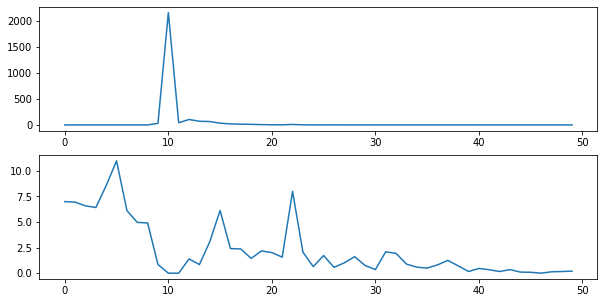

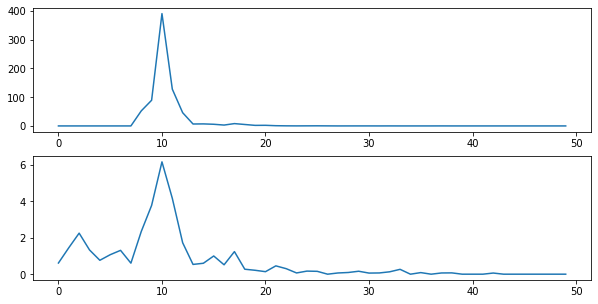

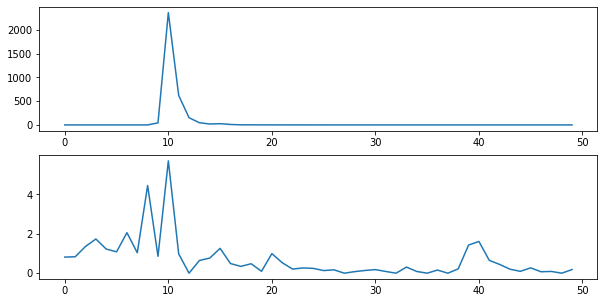

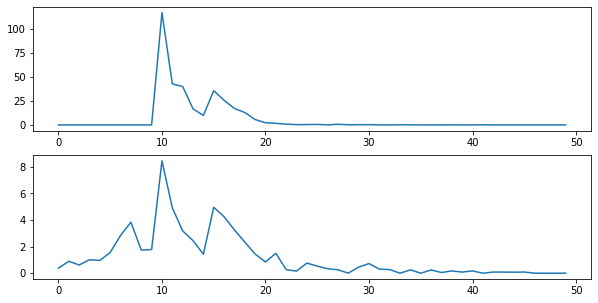

...

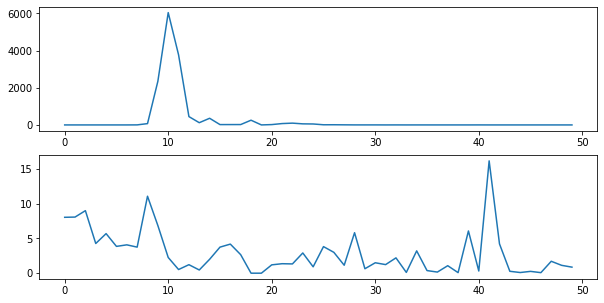

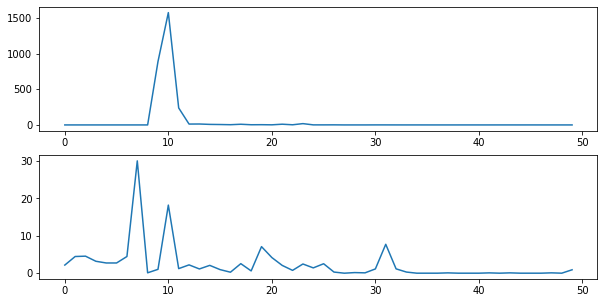

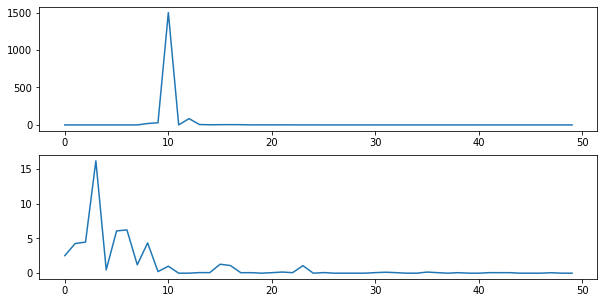

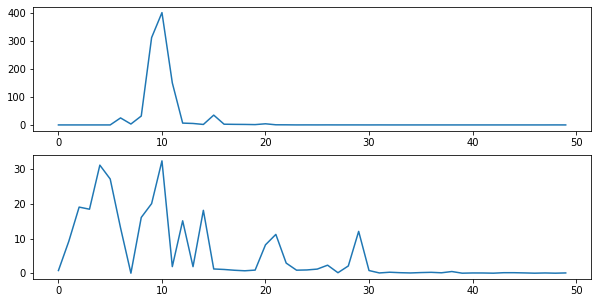

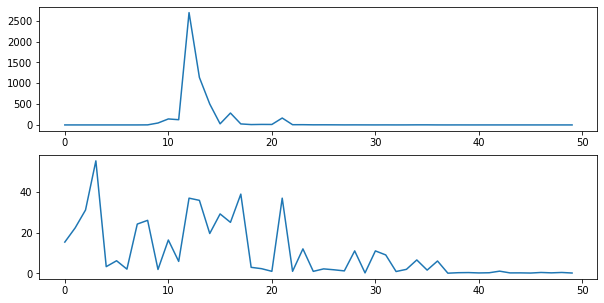

In [89]:
for i in range(len(peaks)):
    fig = plt.figure(figsize=(10,5))
    plt.subplot(2,1,1)
    plt.plot(range(50), df['coho1_hatchery_perhour'][peaks_coho[i]-10:peaks_coho[i]+40])
    #plt.vlines(10,0,6000, "black")
    #plt.yscale("log")
    plt.subplot(2,1,2)
    plt.plot(range(50), df['coho1_wild_perhour'][peaks_coho[i]-10:peaks_coho[i]+40])
    #plt.vlines(10,0,50, "black")

### For each fish type 

#### 1) Make a plot showing selected peaks
#### 2) Make a plot with all hatcheries and all wild
#### 3) Make one figure with 2 subplots for each year
    One for hatchery
    Other for wild

In [261]:
def visualization_hatchery_all(df, species, age):
    fig = plt.figure(figsize=(20,8))
    fs = 18
    if species == "coho":
        threshold = 50
        plt.plot(df['coho1_hatchery_perhour'], color = "cadetblue")
        plt.yscale("log")
        peaks_coho1_on1, _ = find_peaks(df['coho1_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['coho1_hatchery_perhour']
    elif species == "chinook":
        if age == "0":
            threshold = 10
            plt.plot(df['chinook0_hatchery_perhour'], color = "cadetblue")
            peaks_coho1_on1, _ = find_peaks(df['chinook0_hatchery_perhour'], height=threshold) # height is the threshold value
            
            df = df['chinook0_hatchery_perhour']
        elif age == "1":
            threshold = 50
            plt.plot(df['chinook1_hatchery_perhour'], color = "cadetblue")
            plt.yscale("log")
            peaks_coho1_on1, _ = find_peaks(df['chinook1_hatchery_perhour'], height=threshold) # height is the threshold value
            df = df['chinook1_hatchery_perhour']
    elif species == "steelhead":
        threshold = 1
        plt.plot(df['steelheadsmolt_hatchery_perhour'], color = "cadetblue")
        plt.yscale("log")
        peaks_coho1_on1, _ = find_peaks(df['steelheadsmolt_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['steelheadsmolt_hatchery_perhour']
        
#     print(peaks_coho1_on1)
    peaks_coho1_on1_list = []
    for i in range(len(peaks_coho1_on1)): #finding only the first peak in a 4 day interval
        if i == 0:
            peaks_coho1_on1_list.append(peaks_coho1_on1[i])
        else:

            if (peaks_coho1_on1[i]  - peaks_coho1_on1[i-1]) < 100: #changing 4 to 10 #let's say one peaks per year (so 100)
                continue
            else:
                peaks_coho1_on1_list.append(peaks_coho1_on1[i])
    
    plt.scatter(peaks_coho1_on1_list,df[peaks_coho1_on1_list], color = 'r')
    
    plt.yscale("log")
    #plt.xlim(1500,2000)
    
    plt.ylabel("Log hatchery fish per hour", fontsize = fs*1.2)
    plt.xlabel("Time", fontsize = fs*1.2)
    plt.title(species + " " + age, fontsize = fs*2)
    plt.savefig(output_string + '/' + species + age + '_hatchery_all_years.jpeg', dpi = 300)
    return(peaks_coho1_on1_list) 

[413,
 607,
 769,
 968,
 1136,
 1325,
 1523,
 1730,
 1895,
 2068,
 2211,
 2386,
 2571,
 2728]

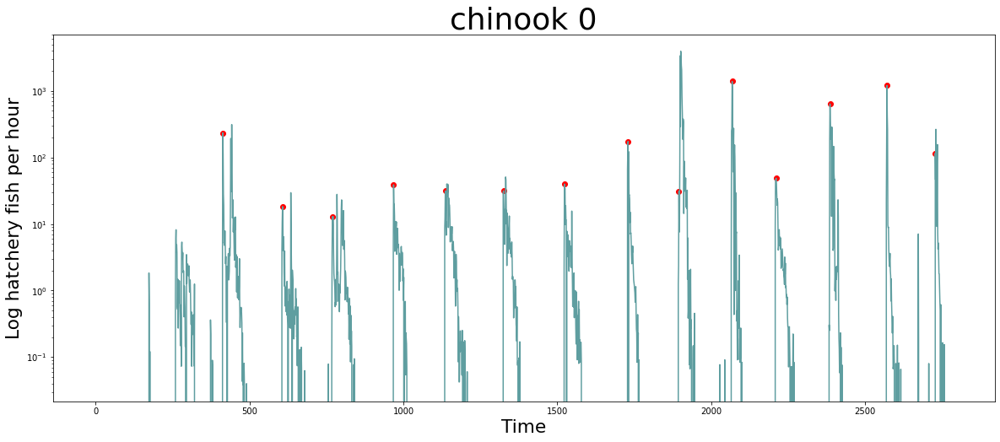

In [222]:
visualization_hatchery_all(df, "chinook","0")

In [257]:
def all_years(df, species, age):
    peaks = visualization_hatchery_all(df, species, age)
    fig = plt.figure(figsize=(12,8))
    plt.subplot(211)
    fs =18
    for i in range(len(peaks)):
        species_string = species+age+"_hatchery_perhour"
        plt.plot(range(50), df[species_string][peaks[i]-10:peaks[i]+40]+1, color="cadetblue", alpha = 0.5, linewidth = 2)
        plt.vlines(10,0,np.max(df[species_string][peaks[i]-10:peaks[i]+40]+1), "gray", alpha = 0.1)
        plt.yscale("log")
#         plt.xlabel("Days",fontsize= fs)
        plt.ylabel("Log hatchery \n fish per hour",fontsize= fs)
        plt.title(species + " " + age, fontsize= fs*1.2)
    plt.subplot(212)
    for i in range(len(peaks)):
        species_string_wild = species+age+"_wild_perhour"
        plt.vlines(10,0,np.max(df[species_string_wild][peaks[i]-10:peaks[i]+40] + 1), "gray", alpha = 0.1)
        plt.plot(range(50), df[species_string_wild][peaks[i]-10:peaks[i]+40] + 1, color= "salmon", linewidth = 2, alpha = 0.5)
        plt.yscale("log")
        plt.xlabel("Days", fontsize= fs)
        plt.ylabel("Log wild \n fish per hour",fontsize= fs)
    plt.savefig(output_string + '/' + species + age + '_hatchery_wild_all_years.jpeg', dpi = 300)

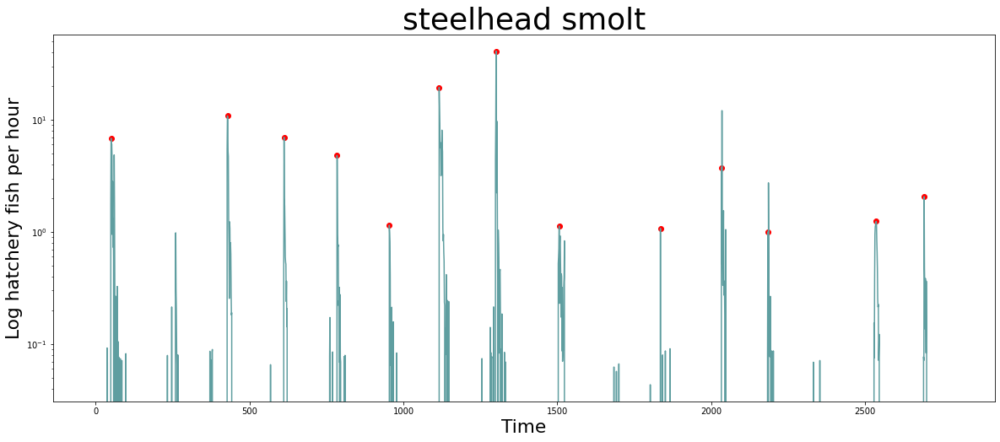

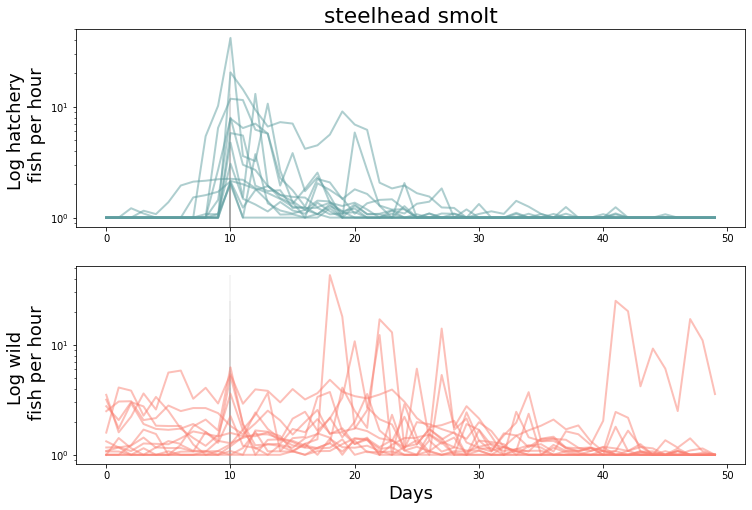

In [262]:
all_years(df, "steelhead", "smolt")

In [238]:
def each_year(df, species, age):
    peaks_coho = visualization_hatchery_all(df, species, age)
    fig = plt.figure(figsize=(15, 15))
    plt.suptitle(species+age, fontsize = 20)
    outer = gridspec.GridSpec(4, 4, wspace=0.2, hspace=0.4)
    species_string = species+age+"_hatchery_perhour"
    species_string_wild = species+age+"_wild_perhour"
    for i in range(len(peaks_coho)):
        inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                        subplot_spec=outer[i], wspace=0.1, hspace=0.4)

        for j in range(2):
            ax = plt.Subplot(fig, inner[j])
    #         t = ax.text(0.5,0.5, 'outer=%d, inner=%d' % (i, j))
    #         t.set_ha('center')
            if j == 0:
                ax.plot(range(50), df[species_string][peaks_coho[i]-10:peaks_coho[i]+40], "cadetblue")
                ax.vlines(10,0,np.max(df[species_string][peaks_coho[i]-10:peaks_coho[i]+40]), "black", alpha = 0.5)
                ax.set_title(df['year'][peaks_coho[i]], fontweight="bold")
            else:               
                ax.plot(range(50), df[species_string_wild][peaks_coho[i]-10:peaks_coho[i]+40], "salmon")
                ax.vlines(10,0,np.max(df[species_string_wild][peaks_coho[i]-10:peaks_coho[i]+40]), "black", alpha = 0.5)
    #         ax.set_xticks([])
    #         ax.set_yticks([])

            fig.add_subplot(ax)
    plt.savefig(output_string + species + age + '_hatchery_wild_each_year.jpeg', dpi = 500)

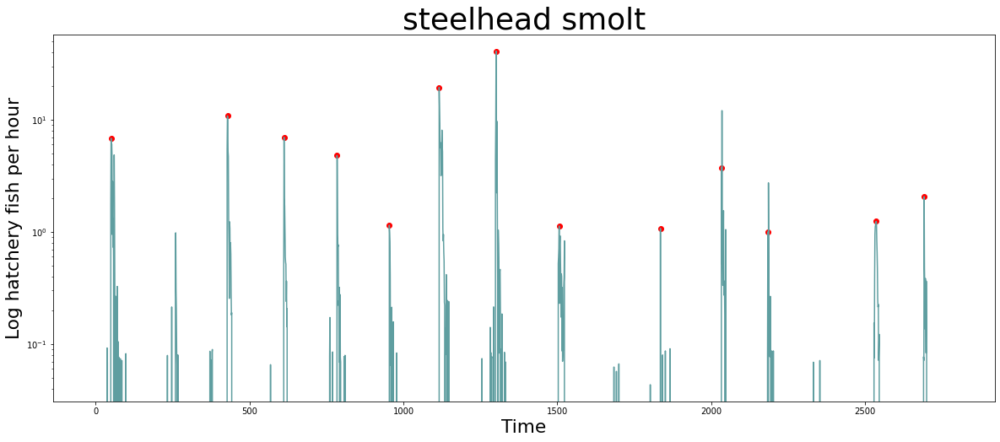

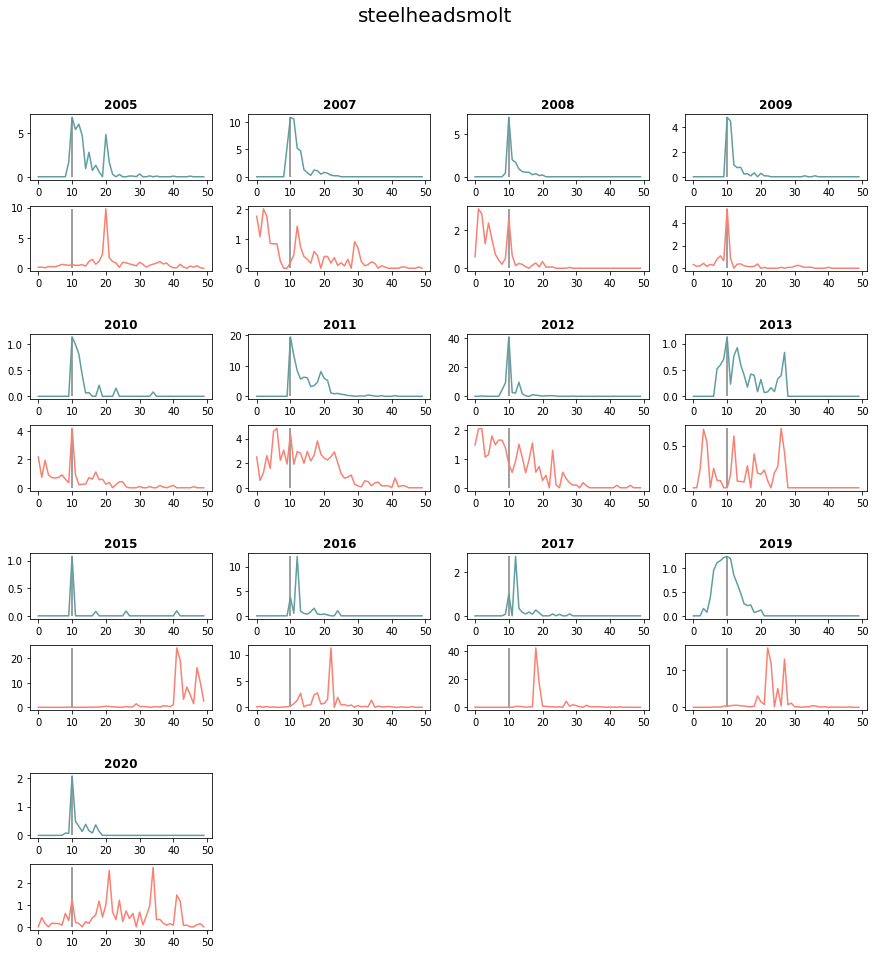

In [263]:
each_year(df, "steelhead", "smolt")